# Imports

In [139]:
import os
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
from matplotlib import pyplot as plt

# Directories

In [140]:
data_dir = Path(os.getcwd()) /".."/"data"/"raw"
label_path = data_dir / "train.csv"
image_dir = data_dir / "train_images"


print(f"DATA DIRECTORY: {data_dir}")
print(f"LABLE FILE PATH: {label_path}")
print(f"IMAGE DIRECTORY: {image_dir}")

DATA DIRECTORY: /home/thomas/co/aptos2019-blindness-detection/notebook/../data/raw
LABLE FILE PATH: /home/thomas/co/aptos2019-blindness-detection/notebook/../data/raw/train.csv
IMAGE DIRECTORY: /home/thomas/co/aptos2019-blindness-detection/notebook/../data/raw/train_images


# Load Label CSV

In [141]:
#Read the csv file with the labels
df = pd.read_csv(label_path)

#Build the full image filename for each sample
df["filename"] = [image_dir/f"{i}.png" for i in df["id_code"]]

# Diagnosis File Generator

In [142]:
def diagnoisis_generator(diagnosis_df):
    """This will load images for a dataframe for a specific diagnosis"""
    while True:
        for i,row in diagnosis_df.iterrows():
            yield (row["filename"],row["diagnosis"])
            

#new dict to hold the generators for each diagnosis
diagnosis_generators = {}

#for each diagnosis
for diagnosis in range(5):
    
    #extract a new dataframe for just this diagnois
    diagnosis_df = df[df["diagnosis"] == diagnosis]   
    
    #add this generator to the dict of generators for each diagnosis
    diagnosis_generators[diagnosis] = diagnoisis_generator(diagnosis_df)
                

# Plot Images

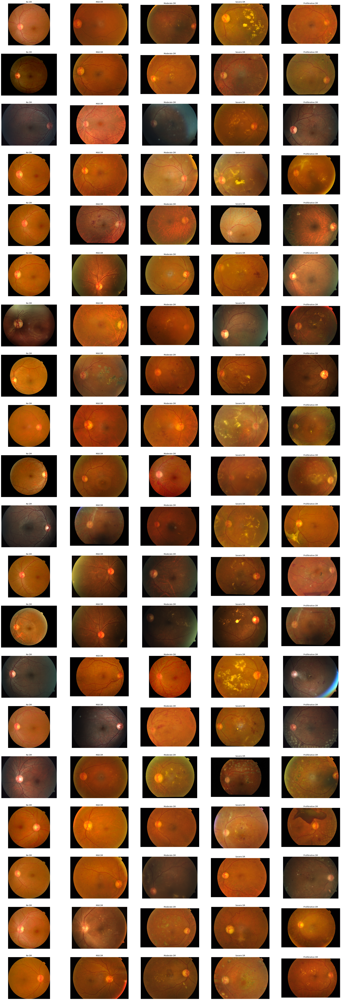

In [143]:
rows = 20
cols = 5
plt.figure(figsize=(40,120))

for i in range(rows):
    for j in range(cols):
        
        plt.subplot(rows,cols, i*cols + j+1)
        
        #get the image path and label for this diagnosis generator
        image_path, label = next(diagnosis_generators[j])
        
        #load the image
        image = Image.open(image_path)
        
        #plot the image
        plt.imshow(image)
       
        #Add the title to the image
        titles = [ "No DR", "Mild DR", "Moderate DR", "Severe DR", "Proliferative DR"]
        plt.title(titles[label])
        plt.axis('off')